# Customs Fraud Detection
## Network analyses

**AI-based Cargo Selectivity for Customs**

# Dependencies

In [108]:
## basics
from datetime import date 
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
from datetime import date 

import warnings
warnings.simplefilter('ignore')

# directories
import os

## plots

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

## preprocessing

# normalization and nulls imputation
from sklearn.preprocessing import StandardScaler, MinMaxScaler

## modelling Libraries
# from xgboost import XGBClassifier
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.linear_model import LogisticRegression 
# from lightgbm import LGBMClassifier

# evaluation & CV Libraries
from sklearn.metrics import precision_score, accuracy_score, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay, f1_score, recall_score
from sklearn.metrics import roc_curve, auc
# train/test
from sklearn.model_selection import train_test_split

# tuning
# from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# cross validation
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate

## saving results
import joblib

## netkorw analyses
import networkx as nx
from networkx.algorithms import bipartite

import regex as re

# Data source

WCO synthetic dataset

2013 - 2014 import basic declaration information

Synthetic data from WCO BACUDA courses

Physically inspected customs items and their declaration data were generated using CTGAN algorithm, which is suitable for demonstration/educational purposes.

In [109]:
# specifying data types from the source
dtypes_dict = {
    'TARIFF.CODE':str,
    'CIF_USD_EQUIVALENT': float,
    'QUANTITY': float,
    'GROSS.WEIGHT': float,
    'TOTAL.TAXES.USD': float,
    'RAISED_TAX_AMOUNT_USD':float,
    'illicit':bool
}

df_original = pd.read_csv('import_data.csv', sep=",", dtype=dtypes_dict)

# to show numbers easier to read
pd.options.display.float_format = '{:.2f}'.format


In [110]:
df_original

,year,month,day,OFFICE,IMPORTER.TIN,TARIFF.CODE,ORIGIN.CODE,CIF_USD_EQUIVALENT,QUANTITY,GROSS.WEIGHT,TOTAL.TAXES.USD,RAISED_TAX_AMOUNT_USD,illicit
0,2013,1,1,OFFICE60,IMP545640,8703232225,CNTRY680,172710.00,1.00,28487.00,3492.00,0.00,False
1,2013,1,1,OFFICE24,IMP252323,8703321220,CNTRY376,7450.00,1.00,185994.00,503.00,0.00,False
2,2013,1,1,OFFICE59,IMP194834,8704212025,CNTRY680,2684.00,1.00,452843.00,5706.00,0.00,False
3,2013,1,1,OFFICE60,IMP668188,3901100000,CNTRY277,7412.00,2018.00,26546.00,3182.00,0.00,False
4,2013,1,1,OFFICE59,IMP395619,8517180000,CNTRY759,2786.00,7044.00,1958.00,587.00,0.00,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,2014,12,31,OFFICE168,IMPO19832,3926909710,CNTRY994,19056.00,1.00,189.00,5.00,0.00,False
199996,2014,12,31,OFFICE296,IMPO10210,8704319941,CNTRY959,532.00,243.00,15.00,234.00,105.00,True
199997,2014,12,31,OFFICE298,IMPO11255,5806200000,CNTRY994,11.00,58.00,24.00,5.00,0.00,False
199998,2014,12,31,OFFICE168,IMPO16962,5807109010,CNTRY376,2826.00,3.00,822.00,5.00,0.00,False


_____

In [111]:
dict_data = {'year':'Year of the operation',
            'month':'Month of the operation',
            'day':'Day of the operation',
            'OFFICE':'Custom office ID in which the importation is declared',
            'IMPORTER.TIN':'Importer ID',
            'TARIFF.CODE':'HS6 codification + local codification',
            'ORIGIN.CODE':'Country ID from where the goods come',
            'CIF_USD_EQUIVALENT':'CIF value declared in USD',
            'QUANTITY':'Unit quantity declared',
            'GROSS.WEIGHT':'Gross weight declared',
            'TOTAL.TAXES.USD':'Taxes/duties paid by the importer',
            'illicit':'Indicator whether the operation was fraud or not' #Taget
            }

# Network analyses

Processing interactions to build edges

In [112]:
import itertools

net_vars = ['OFFICE', 'IMPORTER.TIN', 'ORIGIN.CODE']

# deleting nulls in the columns to process
df_original.dropna(subset = net_vars, inplace = True)
df_original.dropna(subset = ['illicit'], inplace = True)

# ensuring that categorical variables net_vars are str
df_original.loc[:,net_vars] = df_original.loc[:,net_vars].astype(str)

# creating tuples of categotical net_vars
combinations = list(itertools.combinations(net_vars, 2))

# loop to concatenate combinations date with '&&' 
for (cat1, cat2) in combinations:
    colName = cat1 + '&&' + cat2
    df_original.loc[:,colName] = df_original.loc[:,cat1]+'&&'+df_original.loc[:,cat2]

# combinated vars
edges_vars = [col for col in df_original.columns if '&&' in col]

# # processing interactions
# interactions = {}

# for var in edges_vars:
#     for comb in df_original[var].unique():
#         relation = {}
#         df_aux = df_original.loc[df_original[var] == comb]

#         relation['interactions'] = len(df_aux)
#         # adding more information about the interactions
#         relation['total_cif'] = sum(df_aux['CIF_USD_EQUIVALENT'])
#         relation['total_illicits'] = sum(df_aux['illicit'])
#         relation['total_raised_tax'] = sum(df_aux['RAISED_TAX_AMOUNT_USD'])

#         interactions.update({comb : relation})
        
# df_inter = pd.DataFrame(interactions).T    

# df_inter.to_csv('entities_interactions.csv')

it takes more than 15 minutes

In [113]:
# loading processed interactions
df_inter = pd.read_csv('entities_interactions.csv', index_col=0)
df_inter

,interactions,cif,illicits,raised_tax
OFFICE60&&IMP545640,22.00,9968847.00,1.00,736.00
OFFICE24&&IMP252323,1.00,7450.00,0.00,0.00
OFFICE59&&IMP194834,51.00,12951809.00,1.00,557.00
OFFICE60&&IMP668188,5.00,78931.00,0.00,0.00
OFFICE59&&IMP395619,12.00,1798330.00,0.00,0.00
...,...,...,...,...
IMPO11059&&CNTRY881,1.00,324367.00,0.00,0.00
IMPO16488&&CNTRY576,1.00,193.00,0.00,0.00
IMPO15571&&CNTRY764,1.00,17138.00,0.00,0.00
IMPO11255&&CNTRY994,1.00,11.00,0.00,0.00


In [114]:
# processing indexes for filtering
df_inter['aux'] = df_inter.index.str.replace(r'[0-9]','',regex=True)

df_inter[['Nodetype_1', 'Nodetype_2']] = df_inter['aux'].str.split('&&', expand=True)
df_inter['Nodetype_1'] = df_inter['Nodetype_1'].str[0:3]
df_inter['Nodetype_2'] = df_inter['Nodetype_2'].str[0:3]

df_inter['aux'] = df_inter['Nodetype_1'] + '&&' + df_inter['Nodetype_2']

df_inter['aux'].unique()

array(['OFF&&IMP', 'OFF&&CNT', 'IMP&&CNT'], dtype=object)

OFF&&IMP and IMP&&CNT are the relations to focus on



In [115]:
df_inter.loc[df_inter['aux'] != 'OFF&&CNT']['aux'].unique()

array(['OFF&&IMP', 'IMP&&CNT'], dtype=object)

In [116]:
df_inter = df_inter.loc[df_inter['aux'] != 'OFF&&CNT']

In [117]:
# creating columns with node's values

df_inter['aux'] = df_inter.index

df_inter[['Node_1', 'Node_2']] = df_inter['aux'].str.split('&&', expand=True)

In [118]:
df_back = df_inter.copy()

In [119]:
df_inter

,interactions,cif,illicits,raised_tax,aux,Nodetype_1,Nodetype_2,Node_1,Node_2
OFFICE60&&IMP545640,22.00,9968847.00,1.00,736.00,OFFICE60&&IMP545640,OFF,IMP,OFFICE60,IMP545640
OFFICE24&&IMP252323,1.00,7450.00,0.00,0.00,OFFICE24&&IMP252323,OFF,IMP,OFFICE24,IMP252323
OFFICE59&&IMP194834,51.00,12951809.00,1.00,557.00,OFFICE59&&IMP194834,OFF,IMP,OFFICE59,IMP194834
OFFICE60&&IMP668188,5.00,78931.00,0.00,0.00,OFFICE60&&IMP668188,OFF,IMP,OFFICE60,IMP668188
OFFICE59&&IMP395619,12.00,1798330.00,0.00,0.00,OFFICE59&&IMP395619,OFF,IMP,OFFICE59,IMP395619
...,...,...,...,...,...,...,...,...,...
IMPO11059&&CNTRY881,1.00,324367.00,0.00,0.00,IMPO11059&&CNTRY881,IMP,CNT,IMPO11059,CNTRY881
IMPO16488&&CNTRY576,1.00,193.00,0.00,0.00,IMPO16488&&CNTRY576,IMP,CNT,IMPO16488,CNTRY576
IMPO15571&&CNTRY764,1.00,17138.00,0.00,0.00,IMPO15571&&CNTRY764,IMP,CNT,IMPO15571,CNTRY764
IMPO11255&&CNTRY994,1.00,11.00,0.00,0.00,IMPO11255&&CNTRY994,IMP,CNT,IMPO11255,CNTRY994


## Graph creation

In [120]:
# vars to use as nodes
net_vars = ['OFFICE', 'IMPORTER.TIN', 'ORIGIN.CODE']

IM = nx.Graph()

# adding nodes
for i,var in enumerate(net_vars):
    IM.add_nodes_from(df_original[var].unique(), bipartite=i)

# adding edges
edge_var = 'interactions'
for index, row in df_inter.iterrows():
    node1, node2 = index.split('&&')
    IM.add_edge(node1, node2, weight=(row[edge_var]))

In [121]:
nx.is_connected(IM)

True

In [138]:
nx.adjacency_data(IM)

{'directed': False,
 'multigraph': False,
 'graph': [],
 'nodes': [{'bipartite': 0, 'id': 'OFFICE60'},
  {'bipartite': 0, 'id': 'OFFICE24'},
  {'bipartite': 0, 'id': 'OFFICE59'},
  {'bipartite': 0, 'id': 'OFFICE40'},
  {'bipartite': 0, 'id': 'OFFICE92'},
  {'bipartite': 0, 'id': 'OFFICE51'},
  {'bipartite': 0, 'id': 'OFFICE23'},
  {'bipartite': 0, 'id': 'OFFICE16'},
  {'bipartite': 0, 'id': 'OFFICE81'},
  {'bipartite': 0, 'id': 'OFFICE96'},
  {'bipartite': 0, 'id': 'OFFICE76'},
  {'bipartite': 0, 'id': 'OFFICE84'},
  {'bipartite': 0, 'id': 'OFFICE35'},
  {'bipartite': 0, 'id': 'OFFICE88'},
  {'bipartite': 0, 'id': 'OFFICE18'},
  {'bipartite': 0, 'id': 'OFFICE296'},
  {'bipartite': 0, 'id': 'OFFICE298'},
  {'bipartite': 0, 'id': 'OFFICE168'},
  {'bipartite': 0, 'id': 'OFFICE187'},
  {'bipartite': 0, 'id': 'OFFICE233'},
  {'bipartite': 0, 'id': 'OFFICE243'},
  {'bipartite': 0, 'id': 'OFFICE113'},
  {'bipartite': 0, 'id': 'OFFICE204'},
  {'bipartite': 0, 'id': 'OFFICE185'},
  {'bipartite'

In [122]:
# getting info from nodes
office_nodes = [n for n, d in IM.nodes(data=True) if d['bipartite'] == 0]
importer_nodes = [n for n, d in IM.nodes(data=True) if d['bipartite'] == 1]
country_nodes = [n for n, d in IM.nodes(data=True) if d['bipartite'] == 2]

# Create the bipartite layout
pos = {}
pos.update((node, (1, index)) for index, node in enumerate(office_nodes))
pos.update((node, (2, index)) for index, node in enumerate(importer_nodes))
pos.update((node, (3, index)) for index, node in enumerate(country_nodes))

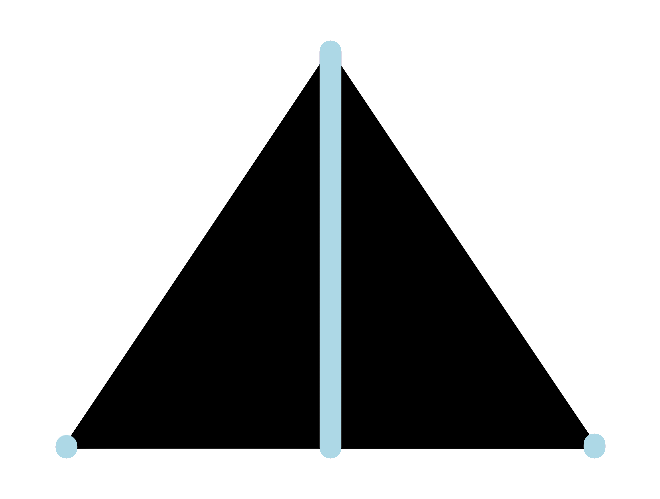

In [123]:
# Draw the bipartite graph
nx.draw(IM, pos=pos, with_labels=False, node_color='lightblue', node_size=200, font_size=10)
plt.show()

In [144]:
enumerate(IM.adjacency())

Plot interactivo con plotly

https://plotly.com/python/network-graphs/

Trate de adaptarlo con chatgpt

In [145]:
# Create positions for nodes in columns
# pos = {}
# for i, var in enumerate(net_vars):
#     pos.update((node, (i, idx)) for idx, node in enumerate(df_original[var].unique()))

# getting info from nodes
office_nodes = [n for n, d in IM.nodes(data=True) if d['bipartite'] == 0]
importer_nodes = [n for n, d in IM.nodes(data=True) if d['bipartite'] == 1]
country_nodes = [n for n, d in IM.nodes(data=True) if d['bipartite'] == 2]

# Create the bipartite layout
pos = {}
pos.update((node, (1, index)) for index, node in enumerate(office_nodes))
pos.update((node, (2, index)) for index, node in enumerate(importer_nodes))
pos.update((node, (3, index)) for index, node in enumerate(country_nodes))

# Create node colors based on bipartite attribute
node_colors = ['blue' if IM.nodes[node]['bipartite'] == 0 else 'red' if IM.nodes[node]['bipartite'] == 1 else 'green' for node in IM.nodes()]

# Create edge traces
edge_x = []
edge_y = []
for edge in IM.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Create node traces
node_x = [pos[node][0] for node in IM.nodes()]
node_y = [pos[node][1] for node in IM.nodes()]

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        color=node_colors,
        size=10,
        line_width=2))

# Color Node Points
node_adjacencies = []
node_text = []
for node, adjacencies in enumerate(IM.adjacency()):
    node_adjacencies.append(len(adjacencies[1]))
    node_text.append('# of connections: '+str(len(adjacencies[1])))

node_trace.marker.color = node_adjacencies
node_trace.text = node_text

# Create Network Graph
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='<br>Bipartite Network Graph',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
fig.show()

## Graph analyses

In [106]:
# Check if the graph is bipartite
is_bipartite = nx.is_bipartite(IM)
print("Is the graph bipartite?", is_bipartite)

# Get the bipartite sets
bipartite_sets = nx.bipartite.sets(IM)
offices_set, importers_set = bipartite_sets
print("Offices:", offices_set)
print("Importers:", importers_set)

# Compute projection graphs for further analysis
office_projection = nx.bipartite.projected_graph(IM, offices_set)
importer_projection = nx.bipartite.projected_graph(IM, importers_set)

# Analyze the projection graphs or perform other computations as needed
# For example, you can compute degree centrality for each node in the projection graphs:
office_degrees = nx.degree_centrality(office_projection)
importer_degrees = nx.degree_centrality(importer_projection)
print("Office degree centrality:", office_degrees)
print("Importer degree centrality:", importer_degrees)


Is the graph bipartite? True
Offices: {'OFFICE101', 'CNTRY837', 'CNTRY689', 'OFFICE246', 'CNTRY843', 'CNTRY278', 'OFFICE117', 'CNTRY765', 'CNTRY687', 'OFFICE234', 'CNTRY846', 'CNTRY554', 'CNTRY915', 'CNTRY622', 'OFFICE105', 'CNTRY546', 'CNTRY984', 'OFFICE168', 'OFFICE84', 'OFFICE223', 'OFFICE122', 'CNTRY891', 'CNTRY558', 'CNTRY133', 'OFFICE298', 'OFFICE81', 'CNTRY825', 'CNTRY407', 'CNTRY284', 'OFFICE132', 'CNTRY184', 'OFFICE23', 'OFFICE94', 'CNTRY748', 'OFFICE292', 'CNTRY311', 'OFFICE123', 'OFFICE186', 'OFFICE59', 'CNTRY317', 'OFFICE288', 'CNTRY125', 'OFFICE220', 'CNTRY263', 'OFFICE35', 'CNTRY917', 'CNTRY409', 'CNTRY959', 'CNTRY659', 'CNTRY654', 'CNTRY747', 'OFFICE40', 'CNTRY334', 'CNTRY625', 'CNTRY378', 'CNTRY389', 'CNTRY562', 'OFFICE222', 'CNTRY709', 'CNTRY153', 'OFFICE289', 'CNTRY436', 'OFFICE136', 'CNTRY859', 'CNTRY349', 'OFFICE109', 'CNTRY764', 'CNTRY376', 'CNTRY473', 'CNTRY627', 'CNTRY364', 'OFFICE210', 'OFFICE297', 'CNTRY316', 'CNTRY328', 'CNTRY785', 'CNTRY713', 'OFFICE34', 'CNT

# Data pre-processing

In [20]:
# # Separating variables types
# allColumns = list(df_original.columns.values)
# target = ['illicit']
# categorical = df_original.drop('illicit', axis = 1).select_dtypes('object').columns.tolist()
# numeric = df_original.drop(['year','month','day','illicit'], axis = 1).select_dtypes('number').columns.tolist()

## Historical

In [21]:
# OUTPUT_PROFILES = 'risk_profiles'

In [22]:
# # split historical vs. new
# df_model = df_original.copy()

# target_info = ['illicit','RAISED_TAX_AMOUNT_USD']
# ori_categorical = df_model.drop(target_info, axis = 1).select_dtypes('object').columns.tolist()
# ori_numeric = df_model.drop(['year','month','day']+target_info, axis = 1).select_dtypes('number').columns.tolist()

# #Seeking for the historic information
# last_year=df_model.year.max()
# last_year

# #Historic data is taken from the data from before the last year and the first semester of the last year
# df_historic = df_model[(df_model.year < last_year) | (df_model.month <= 6)]
# df_historic

# #New data, take only the last semester
# df_new = df_model[(df_model.year == last_year) & (df_model.month > 6)]

# # risk profiling

# from app.risk_profiling import risk_profiling

# df_historic, risk_tables = risk_profiling(df_historic, 
#                                           categorical, 
#                                           target='illicit', 
#                                           save=True, 
#                                           output_path = OUTPUT_PROFILES)

# # output risk tables
# risk_tables

['OFFICE_hist_sum&rate.csv',
 'IMPORTER.TIN_hist_sum&rate.csv',
 'TARIFF.CODE_hist_sum&rate.csv',
 'ORIGIN.CODE_hist_sum&rate.csv',
 'OFFICE&&IMPORTER.TIN_hist_sum&rate.csv',
 'OFFICE&&TARIFF.CODE_hist_sum&rate.csv',
 'OFFICE&&ORIGIN.CODE_hist_sum&rate.csv',
 'IMPORTER.TIN&&TARIFF.CODE_hist_sum&rate.csv',
 'IMPORTER.TIN&&ORIGIN.CODE_hist_sum&rate.csv',
 'TARIFF.CODE&&ORIGIN.CODE_hist_sum&rate.csv',
 'OFFICE_hist_Qsum&Qrate.csv',
 'IMPORTER.TIN_hist_Qsum&Qrate.csv',
 'TARIFF.CODE_hist_Qsum&Qrate.csv',
 'ORIGIN.CODE_hist_Qsum&Qrate.csv',
 'OFFICE&&IMPORTER.TIN_hist_Qsum&Qrate.csv',
 'OFFICE&&TARIFF.CODE_hist_Qsum&Qrate.csv',
 'OFFICE&&ORIGIN.CODE_hist_Qsum&Qrate.csv',
 'IMPORTER.TIN&&TARIFF.CODE_hist_Qsum&Qrate.csv',
 'IMPORTER.TIN&&ORIGIN.CODE_hist_Qsum&Qrate.csv',
 'TARIFF.CODE&&ORIGIN.CODE_hist_Qsum&Qrate.csv']

### Feature engineering

In [24]:
# OUTPUT_STATS = 'stats_info'
# OUTPUT_ACT = 'act_info'

In [25]:
# from app.feature_engine import Feature_engine

# f_engine = Feature_engine(to_comb=categorical, 
#                           risk_tables=risk_tables, 
#                           stats_and_act_work="read",
#                           save_stats=True,
#                           save_act=True,
#                           stats_tables_path=OUTPUT_STATS,
#                           act_tables_path=OUTPUT_ACT,
#                           risk_tables_path=OUTPUT_PROFILES)

# f_engine.fit(X_train)
# X_train = f_engine.transform(X_train)

# Fitting started

## Calculating basic feature to fit

------------------------
## Reading tariff codes stats information
Stats information read

------------------------
## Reading code's activity
Code's activity read

------------------------
------------------------

Reading finished succesfully
------------------------
------------------------
# Transformation

## Creating new basic features

------------------------
## Creating date related features

------------------------
## Creating activity features
Variables: ['OFFICE', 'IMPORTER.TIN', 'ORIGIN.CODE']

------------------------
## Creating tariff codes stats features
Codes: HS06
Variables: ['Unitprice', 'WUnitprice', 'TaxRatio']

Creating new features from stats info
Working on Unitprice stats
Working on WUnitprice stats
Working on TaxRatio stats
------------------------

## Creating new caterical features combining the existing ones
Variables to combine: ['OFFICE', 'IMPORTER.TIN', 'TARIFF.CODE', 'ORIGIN.CODE']

-------------

### Feature pre-selected

Relevance analyzed during experimentation stage.

### Transformation, feature selection and imputation

In [27]:
ori_numeric

['CIF_USD_EQUIVALENT', 'QUANTITY', 'GROSS.WEIGHT', 'TOTAL.TAXES.USD']